In [1]:
#!/usr/bin/env python2
# -*- coding: utf-8 -*-
# Master Research Project 
"""
Created on Sun Mar  3 20:33:17 2019
@author: alexandreduval
"""


########################## SURVIVAL ANALYSIS


# Importing libraries
import numpy as np # linear algebra
import pandas as pd # data processing 
import os
import io
import itertools
import warnings
import math  # for missing values 
import matplotlib.pyplot as plt#visualization
from PIL import  Image
%matplotlib inline
import seaborn as sns #visualization
warnings.filterwarnings("ignore")
import plotly.offline as py #visualization
py.init_notebook_mode(connected=True) #visualization
import plotly.graph_objs as go #visualization
import plotly.tools as tls #visualization
import plotly.figure_factory as ff #visualization

from sklearn.preprocessing import LabelEncoder, OneHotEncoder  # encode categorical variables 
from sklearn.preprocessing import StandardScaler  # standardize data
from sklearn.model_selection import train_test_split  # split between train and test split
from xgboost import XGBClassifier  # model 



# Import dataset 
telcom = pd.read_csv('Telco_customer_churn.csv')
dataset = pd.read_csv('Telco_customer_churn.csv')




############# DATA MANIPULATION 


## Identify missing values 
w=float('nan')
math.isnan(w)
telcom.isna().sum()

# Missing values 
telcom[telcom['TotalCharges']== " "] # 11 missing values for the Total charges column
telcom['TotalCharges'] = telcom["TotalCharges"].replace(" ",np.nan) # replace spaces with null values in TotalCharges column
telcom = telcom[telcom["TotalCharges"].notnull()] # drop these observations 
telcom = telcom.reset_index()[telcom.columns] # reset index 
telcom["TotalCharges"] = telcom["TotalCharges"].astype(float) #convert to float type

#Replace 'No internet service' to 'No' for the following columns. If they don't have internet, they don't have access to these services. 
replace_cols = [ 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection','TechSupport','StreamingTV', 'StreamingMovies']           
for i in replace_cols : 
    telcom[i]  = telcom[i].replace({'No internet service' : 'No'})
    
# Replace 'No phone service' to 'No' for the MultipleLines columns. 
telcom['MultipleLines'] = telcom['MultipleLines'].replace({'No phone service':'No'})
    
# Modify Senior Citizen binary dummy variable. Want Yes or No instead of 0,1; only because other dummies are in this format. Easier to deal with. 
telcom["SeniorCitizen"] = telcom["SeniorCitizen"].replace({1:"Yes",0:"No"})

dataset = telcom.iloc[:, 1:22]       
                          
#Separating churn and non churn customers. 
churn     = telcom[telcom["Churn"] == "Yes"]
not_churn = telcom[telcom["Churn"] == "No"]

# Customer id col
Id_col     = ['customerID']
# Target columns
target_col = ["Churn"]
# Categorical columns
categorical_features = [0,1,2,3,5,6,7,8,9,10,11,12,13,16,17,18,19,20,21,22,23,24,25]
cat_cols   = telcom.nunique()[telcom.nunique() < 6].keys().tolist()
cat_cols   = [x for x in cat_cols if x not in target_col]
#numerical columns
num_cols   = [x for x in telcom.columns if x not in cat_cols + target_col + Id_col]
#Binary columns with 2 values
bin_cols   = telcom.nunique()[telcom.nunique() == 2].keys().tolist()
#Columns more than 2 values
multi_cols = [i for i in cat_cols if i not in bin_cols]




################ Feature engineering part


# Label encoding for Binary columns
le = LabelEncoder()
for i in bin_cols :
    telcom[i] = le.fit_transform(telcom[i])
  
    
# Encode categorical variables. 
telcom = pd.get_dummies(data = telcom,columns = multi_cols )
# No need to delete some dummies to avoid the dummy variable trap, Python handles it. 


# Define dependent and independent variables 
X = telcom.iloc[:, 1: 32]  # delete customer ID from X because won't use it to predict churn. 
X = X.drop(['Churn'], axis = 1) # create dataframe with only independent variables. 
X = X.astype(float)   # keep a dataframe but where all columns are floats. 
Z = X.values  # Save X as an array under the name Z
y = telcom['Churn'].values   # dependent variables, as array. 
features = [i for i in telcom.columns if i not in Id_col + target_col] # Store the name of all variables. 


# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(Z, y, test_size = 0.2, random_state=44)




####### MODEL IMPLEMENTATION


# Fitting tuned XGBoost to the Training set
classifier = XGBClassifier( n_estimators=150, learning_rate=0.15, max_depth=3, min_child_weight=0.6,
                            colsample_bytree=1, subsample=1, reg_alpha=0, gamma=0,
                            booster='gbtree', objective='binary:logistic') 
classifier.fit(X_train, y_train)


# Predicting the Test set and Training set results. Also store predicted probabilities used to classify. 
y_pred = classifier.predict(X_test)
y_pred2 = classifier.predict(X_train)
y_proba = classifier.predict_proba(X_test)   # illustrates confidence about predictions. Useful for interpretations. 
y_proba2 = classifier.predict_proba(X_train)  # for ICE,PDP
y_proba3 = y_proba2[:,1]  # only proba of churners 
#y_proba4 = pd.DataFrame(y_proba3)


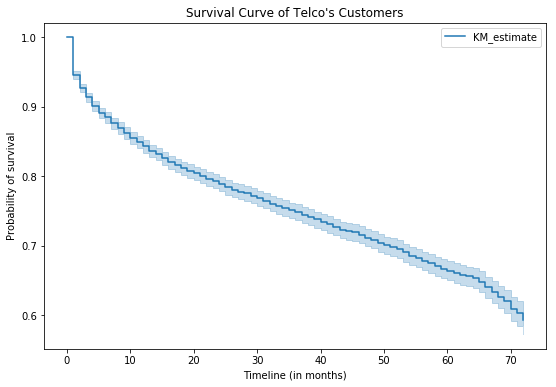

      KM_estimate_upper_0.95  KM_estimate_lower_0.95
0.0                      NaN                     NaN
1.0                 0.951002                0.940418
2.0                 0.933672                0.921506
3.0                 0.920108                0.906857
4.0                 0.907879                0.893733
5.0                 0.898276                0.883473
6.0                 0.892194                0.876991
7.0                 0.884332                0.868630
8.0                 0.877756                0.861650
9.0                 0.870439                0.853893
10.0                0.863174                0.846204
11.0                0.858096                0.840836
12.0                0.851783                0.834169
13.0                0.845365                0.827396
14.0                0.841250                0.823056
15.0                0.834832                0.816292
16.0                0.829907                0.811107
17.0                0.825280                0.

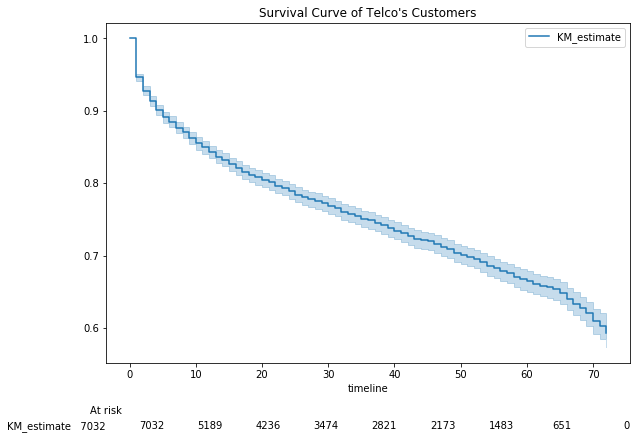

In [2]:
################################ SURVIVAL ANALYSIS





# Import lifelines library - survival analysis 
import lifelines

# Modify dataset telcom
del telcom['customerID']

# Kaplan Meier estimator 
from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()
T = telcom['tenure'] #duration
C = telcom['Churn'] #censorship - 1 if death/churn is seen, 0 if censored
kmf.fit(T, event_observed=C, label='KM_estimate')

# Plot Kaplan Meier estimate of survival curve
kmf.survival_function_
kmf.plot(figsize=(9,6))
plt.title("Survival Curve of Telco's Customers")
plt.xlabel("Timeline (in months)")
plt.ylabel("Probability of survival")
plt.show()

# Some related statistics 
print(kmf.confidence_interval_)
# Accurate table values used to plot survival function
print(kmf.survival_function_)
print('median', kmf.median_)
kmf.event_table

# Options of the plot
kmf.plot(show_censors=False, ci_show=True, at_risk_counts=True,figsize=(9,6) )
plt.title("Survival Curve of Telco's Customers")
plt.show()

          removed  observed  censored  entrance  at_risk
event_at                                                
0.0             0         0         0      7032     7032
1.0           613       380       233         0     7032
2.0           238       123       115         0     6419
3.0           200        94       106         0     6181
4.0           176        83        93         0     5981
5.0           133        64        69         0     5805
6.0           110        40        70         0     5672
7.0           131        51        80         0     5562
8.0           123        42        81         0     5431
9.0           119        46        73         0     5308
10.0          116        45        71         0     5189
11.0           99        31        68         0     5073
12.0          117        38        79         0     4974
13.0          109        38        71         0     4857
14.0           76        24        52         0     4748
15.0           99        37    

Text(0,0.5,'Probability of survival')

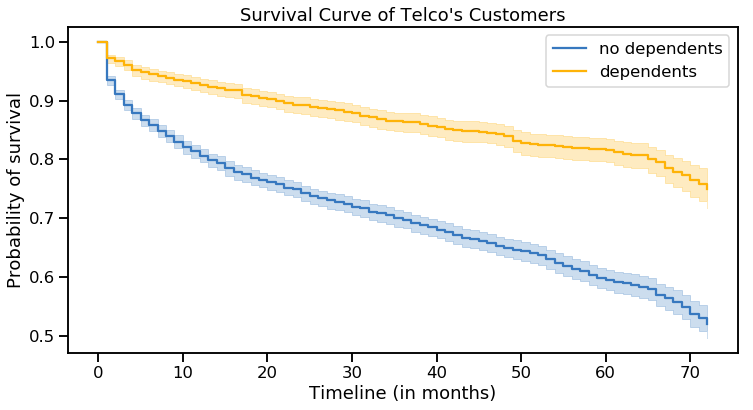

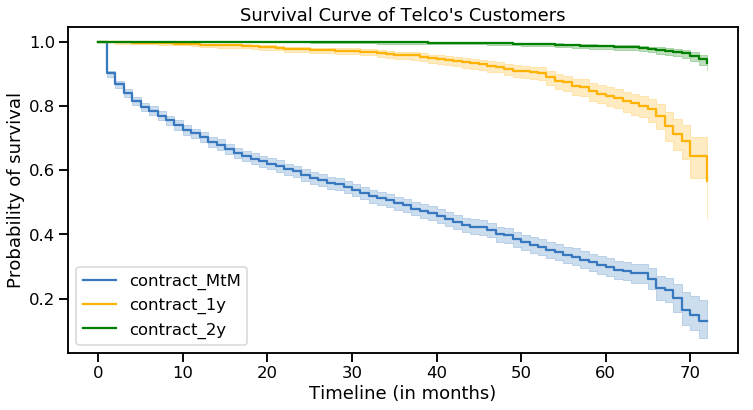

In [4]:
# For several risk counts
# from lifelines.plotting import add_at_risk_counts
# add_at_risk_counts(kmf_exp, kmf_control, ax=ax)

# Survival Tables
from lifelines.utils import survival_table_from_events
table = survival_table_from_events(T, C)
print(table.head(73))

# Underestimated life expectation 
# Take all tenure values 
TT = telcom.tenure
E1 = 0 
for x in np.nditer(TT):
   E1 += x
E1 = E1 / 7032.0  # 32.42
# Even more underestimated 
# Take only censored data
TTC = telcom.tenure[telcom.Churn == 1]
E2 = 0 
for x in np.nditer(TTC):
   E2 += x
E2 = E2 / 1869.0  # 17.98

# Survival curves for some groups - Here Dependents 
has_dependents = (telcom.Dependents == 1)
kmf.fit(T[~has_dependents], C[~has_dependents], label='no dependents')
ax = kmf.plot(figsize=(12,6))
kmf.fit(T[has_dependents], C[has_dependents], label='dependents')
ax = kmf.plot(ax=ax)
plt.title("Survival Curve of Telco's Customers")
plt.xlabel("Timeline (in months)")
plt.ylabel("Probability of survival")
# See improved graph version below

# Survival curves for multiple categorical covariate - Contract 
contract_MtM = (telcom['Contract_Month-to-month'] == 1)
contract_1y = (telcom['Contract_One year'] == 1)
contract_2y = (telcom['Contract_Two year'] == 1)
kmf.fit(T[contract_MtM], C[contract_MtM], label='contract_MtM')
ax = kmf.plot(figsize=(12,6))
kmf.fit(T[contract_1y], C[contract_1y], label='contract_1y')
ax = kmf.plot(ax=ax, figsize=(12,6))
kmf.fit(T[contract_2y], C[contract_2y], label='contract_2y')
ax = kmf.plot(ax=ax, figsize=(12,6), color = 'green')
plt.title("Survival Curve of Telco's Customers")
plt.xlabel("Timeline (in months)")
plt.ylabel("Probability of survival")

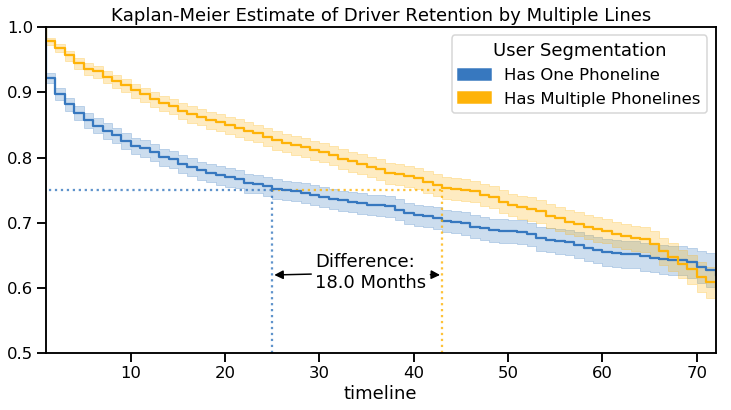

In [5]:
### Improved version of survival curves for a group mentionned above. 
# Kaplan Meier estimate of the survival curve, semented by the attribute MultipleLines. 
palette = ["windows blue", "amber"]
sns.set_palette(sns.xkcd_palette(palette))

#SET UP PLOT
ax = plt.subplot(111)
plt.title('Kaplan-Meier Estimate of Driver Retention by Multiple Lines')
sns.set_context("talk")

d={} #to store the models
vlines = []
i=0

#PLOT FITTED GRAPH
#loop through segmentation variable, plot on same axes
for segment in telcom.MultipleLines.unique(): 
    ix = telcom.MultipleLines == segment
    d['kmf{}'.format(i+1)] = kmf.fit(T.loc[ix],C.loc[ix], label=segment)
    ax = kmf.plot(ax=ax, figsize=(12,6))

    ax.set_xlim([T.min(),T.max()])
    ax.set_ylim([0.5,1])
    
    y_ = kmf.survival_function_[kmf.survival_function_.round(2) ==.75].dropna().index[0]
    ymax_ = kmf.survival_function_[kmf.survival_function_.round(2) ==.75].dropna()[i][y_]
    
    vlines.append([y_, ymax_])
    i+=1

#PLOT ANNOTATION
#for each intercept, plot a horizontal and a vertical line up to the fitted curve
xmin_=0
for i, xy in enumerate(vlines):
    xmax_ = xy[0]
    color="xkcd:{}".format(palette[i])
    
    plt.axvline(x=xy[0], ymax=.5, alpha=.8, color=color, linestyle='dotted') #axes fractional
    plt.hlines(y=.75, xmin=xmin_, xmax=xmax_, alpha=.8, color=color, linestyle='dotted') #axes data coordinates
    xmin_ += xmax_ #to avoid overlapping hlines

# Position text label
difference = vlines[1][0]-vlines[0][0]
label_frac_x = (vlines[0][0]+(difference)/2)/T.max()-.07 #midpoint (minus .07 centering factor)
label_frac_y = 0.2

# Label first line
ax.annotate('Difference:\n{} Months'.format(difference), 
  xy=(vlines[0][0],.62), xycoords='data', color='white',
  xytext=(label_frac_x,label_frac_y), textcoords='axes fraction',
  arrowprops=dict(arrowstyle="-|>", #arrows removed for reability
                  fc="k", ec="k")
           )

# Label second line    
ax.annotate('Difference:\n{} Months'.format(difference), 
      xy=(vlines[1][0],.62), xycoords='data', color='black',
      xytext=(label_frac_x, label_frac_y), textcoords='axes fraction',
      arrowprops=dict(arrowstyle="-|>", #arrows removed for reability
                      fc="k", ec='k')
           )

# LEGEND
#override default legend
import matplotlib.patches as mpatches
patches = [ mpatches.Patch(color="xkcd:windows blue", label='Has One Phoneline'),
            mpatches.Patch(color="xkcd:amber", label='Has Multiple Phonelines')
          ]
plt.legend(handles=[patches[0],patches[1]], title="User Segmentation", loc='best');

          NA_estimate
timeline             
0.0          0.000000
1.0          0.055550
2.0          0.074896
3.0          0.090219
4.0          0.104193
      Non-dependents_upper_0.95  Non-dependents_lower_0.95
0.0                    0.000000                   0.000000
1.0                    0.075287                   0.060510
2.0                    0.102575                   0.084985
3.0                    0.123207                   0.103667
4.0                    0.139646                   0.118625
5.0                    0.155006                   0.132645
6.0                    0.164390                   0.141228
7.0                    0.177092                   0.152863
8.0                    0.187519                   0.162426
9.0                    0.199393                   0.173327
10.0                   0.211899                   0.184818
11.0                   0.220026                   0.192290
12.0                   0.229618                   0.201110
13.0                

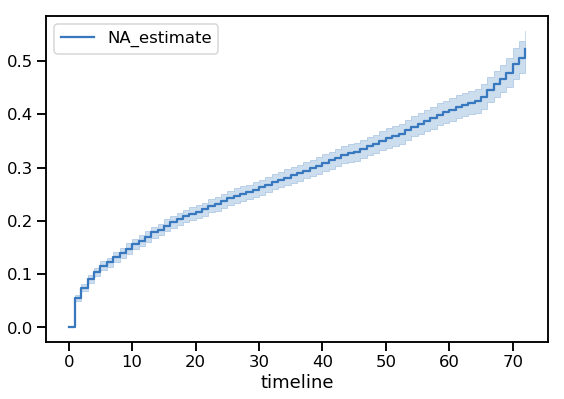

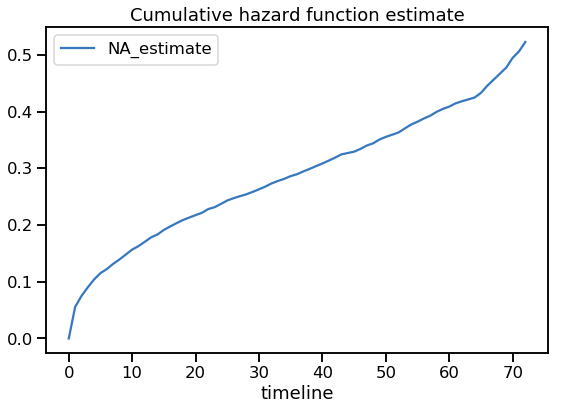

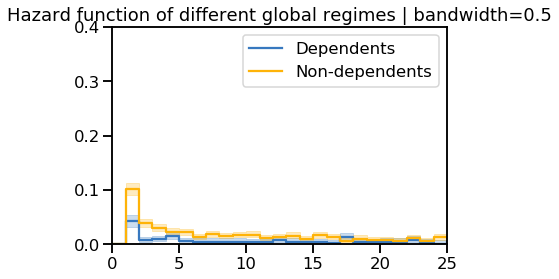

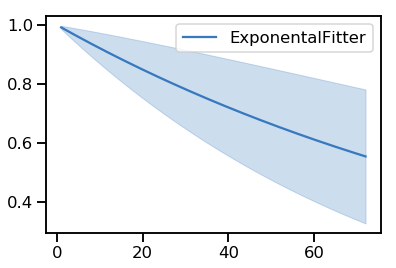

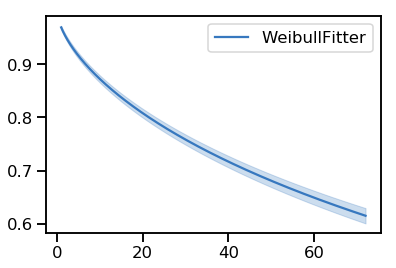

In [6]:

###### Hazard function



# Hazard function - estimation with Nelson Aalen estimator
from lifelines import NelsonAalenFitter
naf = NelsonAalenFitter()
naf.fit(T,event_observed=C)
print(naf.cumulative_hazard_.head())
naf.plot(figsize=(9,6))
naf.cumulative_hazard_.plot(figsize=(9,6))
plt.title('Cumulative hazard function estimate')


# Smoothing hazard function - Dependents
bandwidth = 0.5  # no obvious way to choose this
naf.fit(T[has_dependents], event_observed=C[has_dependents], label="Dependents")
ax = naf.plot_hazard(bandwidth=bandwidth)
naf.fit(T[~has_dependents], event_observed=C[~has_dependents], label="Non-dependents")
naf.plot_hazard(ax=ax, bandwidth=bandwidth)
plt.title("Hazard function of different global regimes | bandwidth=%.1f" % bandwidth);
plt.ylim(0, 0.4)
plt.xlim(0, 25);

# Statistics on cumulative hazard function plotted
print(naf.confidence_interval_)


# Import library 
# log rank test to approximate hazard ratios. Log rank test's hypothesis is that hazard of 2 groups are the same at a any point in time (hazard ratio = 1)
# We then use the logrank statistic obtain to compute the true hazard ratio. 
from lifelines.statistics import logrank_test


# Compare hazards of two groups of individuals, segmented by their gender
gender_male = (telcom["gender"] == 1)
res_gender = logrank_test(T[gender_male], T[~gender_male], C[gender_male], C[~gender_male], alpha=0.95 ) #at 95% confidence level
res_gender.print_summary() # p value of 0.47, don't reject the null hypothesis. Hazard can be equal across two groups at any point in time. 
# Compute hazard ratio from log rank test
Z = res_gender.test_statistic
D = C.sum() #number of events observed
hazard_ratio = np.exp(Z*np.sqrt(4.0/D))
print(hazard_ratio) # hazard ratio of 1.025! death rates are the same at any point in time for both groups. gender has no impact. 


# Compare hazards of two groups of individuals, segmented by the variable Dependents. 
has_dependents = (telcom['Dependents'] == 1)
res_has_dependents = logrank_test(T[has_dependents], T[~has_dependents], C[has_dependents], C[~has_dependents],  alpha=0.95)
res_has_dependents.print_summary()
print('p_value', res_has_dependents.p_value) # we reject the hypothesis. Event rates are not the same for indiv with and without dependents.  
# Hazard ratio - No need here - won't be relevant because curves cross!  
Z = res_has_dependents.test_statistic
D = C.sum() #number of events observed
hazard_ratio = np.exp(Z*np.sqrt(4.0/D))
print(hazard_ratio)
# 4731 --> not relevant (because curves might cross) 


# Subset of case treated above 
# Survival differences at 1 point in time rather than comparing entire curve
# Also hypothesis testing - null hypo is that there is no differences. 
from lifelines.statistics import survival_difference_at_fixed_point_in_time_test
surv_diff = survival_difference_at_fixed_point_in_time_test(10, T[has_dependents], T[~has_dependents], C[has_dependents], C[~has_dependents],  alpha=0.95)
surv_diff.print_summary()
# For dependents, we reject it at the 5% significance level

# For gender
surv_diff = survival_difference_at_fixed_point_in_time_test(10, T[gender_male], T[~gender_male], C[gender_male], C[~gender_male],  alpha=0.95)
surv_diff.print_summary()
# Don't reject it - there are quasi no differences in the two survival functions 


# Log rank test 
# For multivariate categorical variable - Contract
from lifelines.statistics import multivariate_logrank_test
res_contract = multivariate_logrank_test(telcom['tenure'], dataset['Contract'], telcom['Churn'])
res_contract.print_summary()
print('p_value', res_contract.p_value) # p value lower than 0.05
# This means that hazard rates are different for Contract_MtM, 1year and 2years subscribers. 



# Only to see what it looks like 

# Exponential Fitter / model
from lifelines import ExponentialFitter
exf = ExponentialFitter().fit(T, C, label='ExponentalFitter')
exf.plot_survival_function()

# Weibull estimator
from lifelines import WeibullFitter
wbf = WeibullFitter().fit(T, C, label='WeibullFitter')
wbf.plot_survival_function()

Text(0.5,1,'Observed lifetimes at time 65')

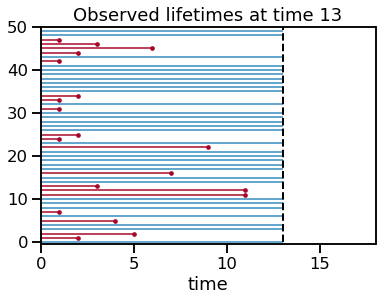

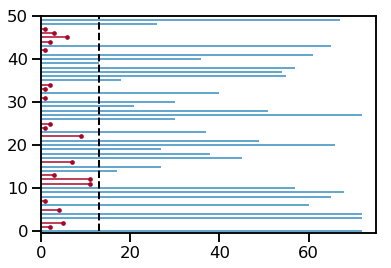

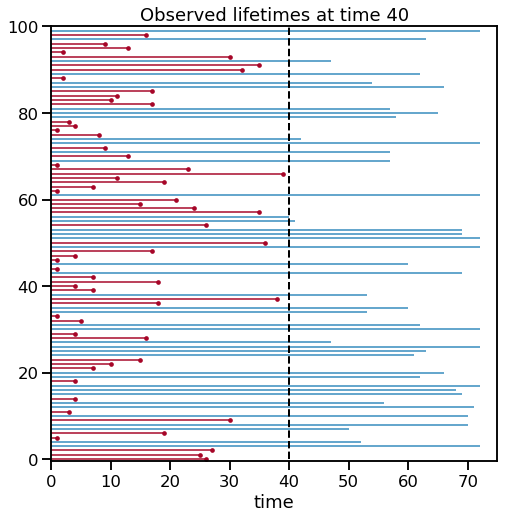

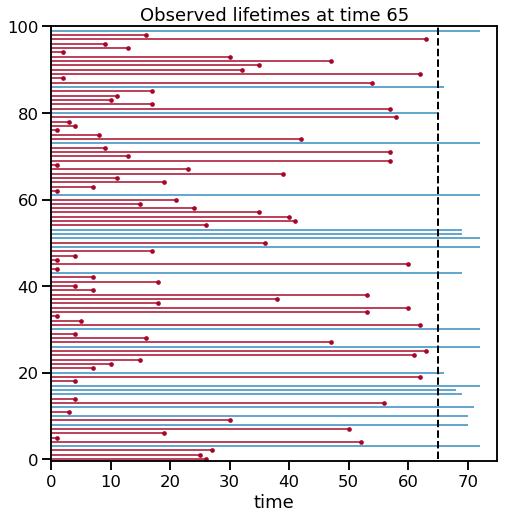

In [8]:
########  CENSORING


# Import libraries
from lifelines.plotting import plot_lifetimes
from numpy.random import uniform, exponential

# Representation of censoring for a random sample of the dataset
CURRENT_TIME = 13  # look at customers that have churned before the first year
N =50
random_subset = telcom.sample(N, random_state = 44) # Select instances randomly from dataset telcom
actual_lifetimes = random_subset['tenure']
actual_lifetimes = actual_lifetimes.reset_index(drop=True)
observed_lifetimes = np.minimum(actual_lifetimes, CURRENT_TIME)
death_observed = actual_lifetimes < CURRENT_TIME
ax = plot_lifetimes(observed_lifetimes, event_observed=death_observed)
ax.set_xlim(0, CURRENT_TIME +5)
ax.vlines(CURRENT_TIME, 0, N, lw=2, linestyles='--')
ax.set_xlabel("time")
ax.set_title("Observed lifetimes at time %d" % (CURRENT_TIME) )


# Same but view where each customer churns 
N=75
ax = plot_lifetimes(actual_lifetimes, event_observed=death_observed)
ax.vlines(CURRENT_TIME, 0, N, lw=2, linestyles='--')
ax.set_xlim(0, N)


# Play with this one to find patterns in the data. 
CURRENT_TIME = 40  # customers that have churned before 2 years
N = 100
random_subset = telcom.sample(N, random_state =1) # Select instances randomly from dataset telcom
actual_lifetimes = random_subset['tenure']
actual_lifetimes = actual_lifetimes.reset_index(drop=True)
observed_lifetimes = np.minimum(actual_lifetimes, CURRENT_TIME)
death_observed = actual_lifetimes < CURRENT_TIME
plt.figure(figsize=(8,8))
bx= plt.subplot()
ax = plot_lifetimes(actual_lifetimes, event_observed=death_observed, ax=bx)
ax.vlines(CURRENT_TIME, 0, N, lw=2, linestyles='--')
ax.set_xlim(0, 75)
ax.set_xlabel("time")
ax.set_title("Observed lifetimes at time %d" % (CURRENT_TIME) )


# Play with this one to find patterns in the data. 
CURRENT_TIME = 65  # customers that have churned before 2 years
N = 100
random_subset = telcom.sample(N, random_state =1) # Select instances randomly from dataset telcom
actual_lifetimes = random_subset['tenure']
actual_lifetimes = actual_lifetimes.reset_index(drop=True)
observed_lifetimes = np.minimum(actual_lifetimes, CURRENT_TIME)
death_observed = actual_lifetimes < CURRENT_TIME
plt.figure(figsize=(8,8))
bx= plt.subplot()
ax = plot_lifetimes(actual_lifetimes, event_observed=death_observed, ax=bx)
ax.vlines(CURRENT_TIME, 0, N, lw=2, linestyles='--')
ax.set_xlim(0, 75)
ax.set_xlabel("time")
ax.set_title("Observed lifetimes at time %d" % (CURRENT_TIME) )

Iteration 1: norm_delta = 2.29112, step_size = 0.9500, ll = -15653.03964, newton_decrement = 2319.28370, seconds_since_start = 0.0
Iteration 2: norm_delta = 1.51747, step_size = 0.9500, ll = -13337.92167, newton_decrement = 468.88276, seconds_since_start = 0.1
Iteration 3: norm_delta = 0.93542, step_size = 0.9500, ll = -12806.44214, newton_decrement = 115.81352, seconds_since_start = 0.1
Iteration 4: norm_delta = 0.40912, step_size = 1.0000, ll = -12674.58736, newton_decrement = 13.68172, seconds_since_start = 0.1
Iteration 5: norm_delta = 0.05542, step_size = 1.0000, ll = -12659.91989, newton_decrement = 0.22330, seconds_since_start = 0.1
Iteration 6: norm_delta = 0.00139, step_size = 1.0000, ll = -12659.69305, newton_decrement = 0.00015, seconds_since_start = 0.2
Iteration 7: norm_delta = 0.00000, step_size = 1.0000, ll = -12659.69290, newton_decrement = 0.00000, seconds_since_start = 0.2
Convergence completed after 7 iterations.


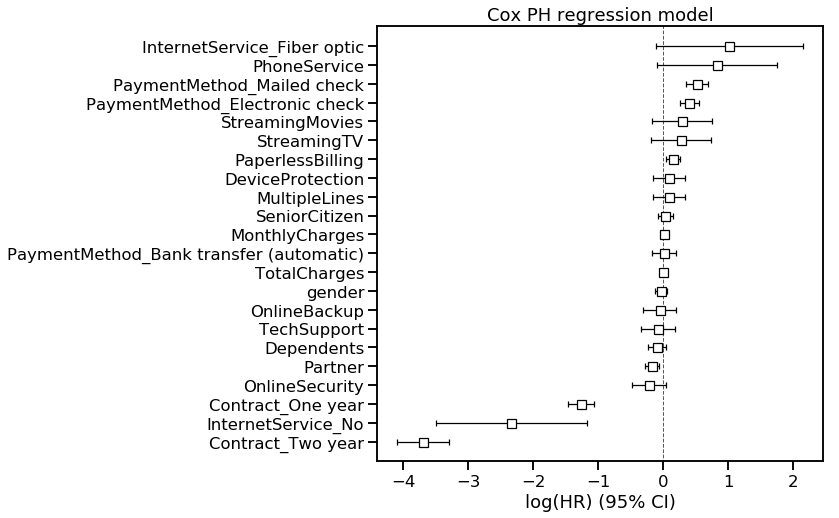

<lifelines.CoxPHFitter: fitted with 7032 observations, 5163 censored>
      duration col = 'tenure'
         event col = 'Churn'
number of subjects = 7032
  number of events = 1869
    log-likelihood = -12659.69
  time fit was run = 2019-03-27 14:39:35 UTC

---
                                         coef  exp(coef)  se(coef)      z      p  -log2(p)  lower 0.95  upper 0.95
gender                                  -0.04       0.96      0.05  -0.85   0.40      1.33       -0.13        0.05
SeniorCitizen                            0.03       1.04      0.06   0.61   0.54      0.88       -0.08        0.15
Partner                                 -0.18       0.84      0.06  -3.23 <0.005      9.67       -0.29       -0.07
Dependents                              -0.09       0.91      0.07  -1.31   0.19      2.40       -0.23        0.05
PhoneService                             0.83       2.29      0.47   1.75   0.08      3.63       -0.10        1.76
MultipleLines                            0.09   

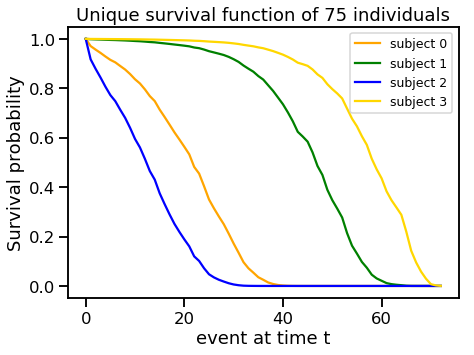

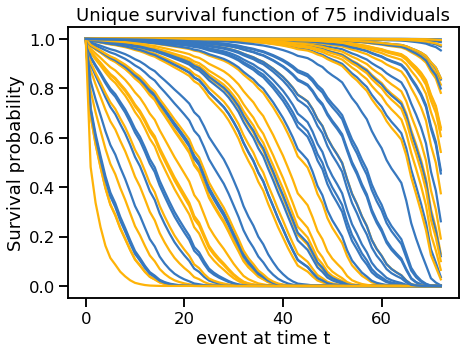

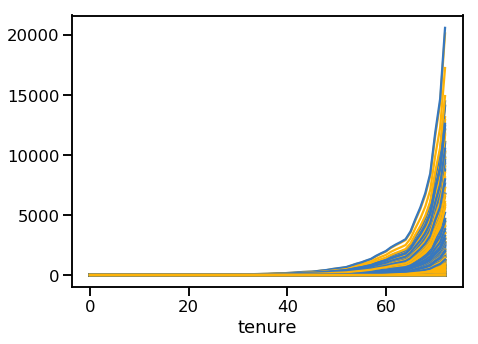

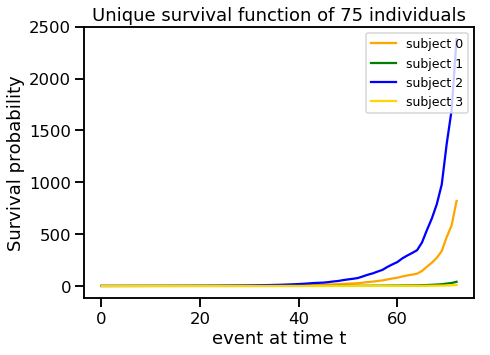

In [12]:
##########################  REGRESSION



# Cox PH regression is sensitive to Multicolinearity
### VIF: variance inflation indication - qualifies severity of multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns  # X is the telcom dataset without the dependent variable
vif.round(1)

# Delete one of the dummy variable to avoid dummy variable trap! 
# Compulsory step otherwise cannot fit the Cox PH regression model. 
telcom_cox = telcom.drop(['Contract_Month-to-month', 'PaymentMethod_Credit card (automatic)', 'InternetService_DSL'], axis=1)

# VIF again on new dataset
vif2 = pd.DataFrame()
vif2["VIF Factor"] = [variance_inflation_factor(telcom_cox.values, i) for i in range(telcom_cox.shape[1])]
vif2["features"] = telcom_cox.columns
vif2.round(1)

### Using Cox Proportional Hazards model
from lifelines import CoxPHFitter
cph = CoxPHFitter()
cph.fit(telcom_cox, duration_col='tenure', event_col='Churn', show_progress = True )
plt.figure(figsize=(8,8))
ax = plt.subplot()
cph.plot(ax=ax)
plt.title('Cox PH regression model')
plt.show()

# Cox model regression table (coef)
cph.print_summary(2) 

# Stats and Methods of cph
dir(cph) # display all methods
cph.hazards_
cph.baseline_hazard_  # true coefficients at baseline value of each covariate
cph._log_likelihood   # compute log likelihood 
cph._concordance_score_ # Goodness of fit. Here very good!
cph.predict_expectation(telcom_cox)   # Life expectation of each individual (expected lifetimes)
cph.predict_median(telcom_cox) # Median
cph.predict_cumulative_hazard(telcom_cox)  # get cumulative hazard curve
cph.predict_survival_function(telcom_cox)  # predict survival function for individuals given their covariate. (It is assumed that individual has just entered the study)
cph.predict_percentile(telcom_cox, p=0.75) # return time at which p=0.8 is achieved
cph.plot_covariate_groups  # population segmentation wrt a covariate

# Returns the prediction of the survival function for individuals, given covariates.
telcom_cox_2 = telcom_cox.drop(['Churn', 'tenure'], axis=1)

# Get the unique survival functions of four subjects
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_survival_function(telcom_cox_2.iloc[0:4]).plot(ax=ax,color = ['orange', 'green', 'blue', 'gold']) 
plt.legend(['subject 0', 'subject 1', 'subject 2', 'subject 3'], loc='upper right', fontsize='x-small')
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Unique survival function of 75 individuals')
plt.show()


# For many subjects 
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_survival_function(telcom_cox_2.iloc[100:175]).plot(ax=ax)
ax.legend().set_visible(False)
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Unique survival function of 75 individuals')

# Prediction of survival proba of every consumer at this particular time. 
cph.predict_survival_function(telcom_cox, times=[1, 10, 25, 50])   # same as telcom_cox_2
# telcom_cox is a dataframe so order of columns does not matter

# Partial hazard
cph.predict_partial_hazard(telcom_cox)

# The cumulative hazard of individuals over the timeline
cph.predict_cumulative_hazard(telcom_cox) # dataframe
# Plot a subset of these cumulative hazards curves. Let's say for 500 individuals. 
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_cumulative_hazard(telcom_cox.iloc[0:500]).plot(ax=ax) 
plt.xlabel('tenure')
ax.legend().set_visible(False)


# Get the unique survival functions of four subjects
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_cumulative_hazard(telcom_cox_2.iloc[0:4]).plot(ax=ax,color = ['orange', 'green', 'blue', 'gold']) 
plt.legend(['subject 0', 'subject 1', 'subject 2', 'subject 3'], loc='upper right', fontsize='x-small')
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Unique survival function of 75 individuals')
plt.show()

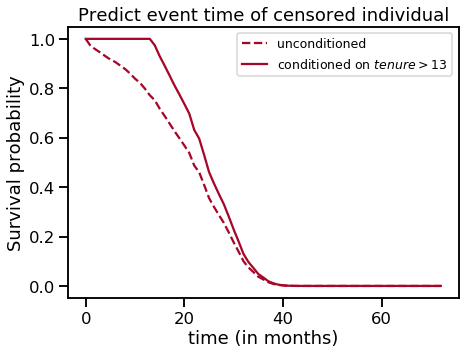

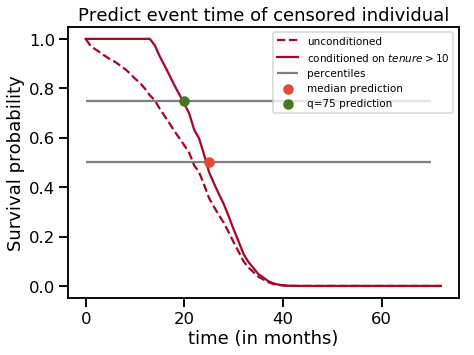

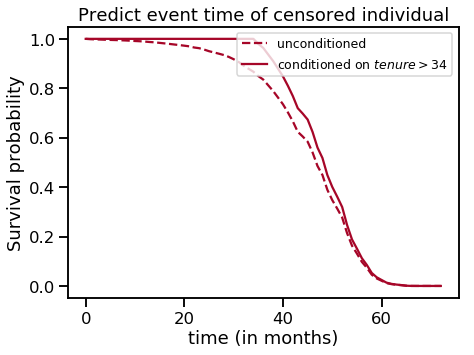

In [13]:
### CENSORED INDIVIDUALS AND CONDITIONAL PROBABILITIES


# Predict event time of censored individuals (only those who did not churn during the study time)
censored_subjects = telcom_cox.loc[telcom_cox['Churn'] == 0]
unconditioned_sf = cph.predict_survival_function(censored_subjects)
conditioned_sf = unconditioned_sf.apply(lambda c: (c / c.loc[telcom_cox.loc[c.name, 'tenure']]).clip_upper(1))
# let's focus on a single subject
subject = 30 
censored_subjects.iloc[30,:] # tenure = 13, has not churned yet
plt.figure(figsize=(7,5))
ax = plt.subplot()
unconditioned_sf.iloc[:,subject].plot(ls="--", color="#A60628", label="unconditioned", ax=ax)
conditioned_sf.iloc[:,subject].plot(color="#A60628", label="conditioned on $tenure>13$")
plt.ylabel('Survival probability')
plt.xlabel('time (in months)')
plt.title('Predict event time of censored individual')
plt.legend(fontsize='x-small', loc = 'upper right') 


# From here, you can pick a median or percentile as a best guess as to the subject’s event time:
from lifelines.utils import median_survival_times, qth_survival_times
predictions_50 = median_survival_times(conditioned_sf)
predictions_75 = qth_survival_times(0.75, conditioned_sf)

# plotting subject 30 again
# Can pick a median or a percentile as best guess for churn's time occurence
subject = 30
plt.figure(figsize=(7,5))
ax = plt.subplot()
unconditioned_sf.iloc[:,subject].plot(ls="--", color="#A60628", label="unconditioned", ax=ax)
conditioned_sf.iloc[:,subject].plot(color="#A60628", label="conditioned on $tenure>10$",ax=ax)
plt.hlines([0.5, 0.75], 0, 70, alpha=0.5, label="percentiles")
plt.scatter(median_survival_times(conditioned_sf.iloc[:,subject]), 0.5,  color="#E24A33", label="median prediction", zorder=20)
plt.scatter(qth_survival_times(0.75, conditioned_sf.iloc[:,subject]), 0.75,  color="#467821", label="q=75 prediction", zorder=20)
plt.ylabel('Survival probability')
plt.xlabel('time (in months)')
plt.title('Predict event time of censored individual')
plt.legend(fontsize='xx-small', loc = 'upper right')

# careful it can be infinite sometimes...  Like for 12th or 15th individual of the (un)conditioned_sf dataframe. 


# Other example
# Predict event time of censored individuals (only those who did not churn during the study time)
censored_subjects = telcom_cox.loc[telcom_cox['Churn'] == 0]
unconditioned_sf = cph.predict_survival_function(censored_subjects)
conditioned_sf = unconditioned_sf.apply(lambda c: (c / c.loc[telcom_cox.loc[c.name, 'tenure']]).clip_upper(1))
# let's focus on a single subject
subject = 1 
censored_subjects.iloc[1,:] # tenure = 34, has not churned yet
plt.figure(figsize=(7,5))
ax = plt.subplot()
unconditioned_sf.iloc[:,subject].plot(ls="--", color="#A60628", label="unconditioned", ax=ax)
conditioned_sf.iloc[:,subject].plot(color="#A60628", label="conditioned on $tenure>34$")
plt.ylabel('Survival probability')
plt.xlabel('time (in months)')
plt.title('Predict event time of censored individual')
plt.legend(fontsize='x-small', loc = 'upper right')



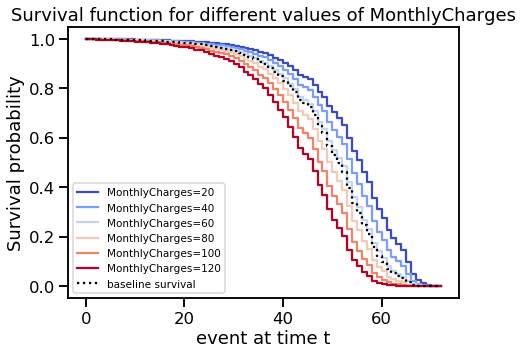

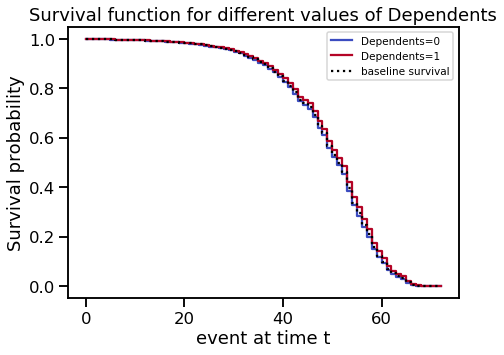

In [14]:
### COVARIATE SEGMENTATION ! 
# Plot what the survival curves look like as we vary a single covariate while holding everything else equal. 
# This is useful to understand the impact of a covariate, given the model
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.plot_covariate_groups('MonthlyCharges', [20, 40, 60, 80, 100, 120], cmap='coolwarm', ax=ax)
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Survival function for different values of MonthlyCharges')
plt.legend(fontsize='xx-small')

# Another, dummy variable this time
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.plot_covariate_groups('Dependents', [0,1], cmap='coolwarm', ax=ax)
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Survival function for different values of Dependents')
plt.legend(fontsize='xx-small')

In [15]:
#####################  CHECK PH ASSUMPTIONS


# Use already implemented function that checks if PH assumptions are satified or not. 
cph.check_assumptions(telcom_cox)
# Not satisfied for several variables  

# Alternative method
from lifelines.statistics import proportional_hazard_test
results = proportional_hazard_test(cph, telcom_cox, time_transform='rank')
results.print_summary(decimals=3, model="untransformed variables")

# Interpret results
# 5 Variables --> Partner, TotalCharges,  InternetService_No, Contract_Two year and PaymentMethod_Mailed check
# have a p-value below 0.05. Reject hypothesis of proportional hazards. There violation of assumptions for these variables.



The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some covariates
will be below the threshold (i.e. by chance). This is compounded when there are many covariates.

Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and eyeball tests to
determine the most serious violations.


<lifelines.StatisticalResult>
degrees_of_freedom = 1
 null_distribution = chi squared
         test_name = proportional_hazard_test

---
                                              test_statistic      p  -log2(p)
Contract_One year                       km            115.75 <0.005     87.26
                                        rank          103.31 <0.005     78.21
Contract_Two year                       km            152.13 <0.005    113.70
                                        rank          124.61 <0.005     93.70
Depende

['__class__',
 '__delattr__',
 '__dict__',
 '__doc__',
 '__format__',
 '__getattribute__',
 '__hash__',
 '__init__',
 '__module__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_batch_mode',
 '_check_values',
 '_clusters',
 '_compute_baseline_cumulative_hazard',
 '_compute_baseline_hazard',
 '_compute_baseline_hazards',
 '_compute_baseline_survival',
 '_compute_confidence_intervals',
 '_compute_delta_beta',
 '_compute_deviance',
 '_compute_likelihood_ratio_test',
 '_compute_martingale',
 '_compute_p_values',
 '_compute_sandwich_estimator',
 '_compute_scaled_schoenfeld',
 '_compute_schoenfeld',
 '_compute_schoenfeld_within_strata',
 '_compute_score',
 '_compute_score_within_strata',
 '_compute_standard_errors',
 '_compute_z_values',
 '_concordance_score_',
 '_get_efron_values_batch',
 '_get_efron_values_single',
 '_hessian_',
 '_log_likelihood',
 '_n_examples',
 '_newton_rhaphson',
 '_norm_mea

Iteration 1: norm_delta = 2.03962, step_size = 0.9500, ll = -14759.71502, newton_decrement = 1660.22598, seconds_since_start = 0.0
Iteration 2: norm_delta = 1.22154, step_size = 0.9500, ll = -12976.64944, newton_decrement = 327.34796, seconds_since_start = 0.1
Iteration 3: norm_delta = 0.70158, step_size = 0.9500, ll = -12600.46857, newton_decrement = 54.94135, seconds_since_start = 0.1
Iteration 4: norm_delta = 0.19191, step_size = 1.0000, ll = -12540.56126, newton_decrement = 2.80110, seconds_since_start = 0.2
Iteration 5: norm_delta = 0.00842, step_size = 1.0000, ll = -12537.68217, newton_decrement = 0.00523, seconds_since_start = 0.2
Iteration 6: norm_delta = 0.00002, step_size = 1.0000, ll = -12537.67694, newton_decrement = 0.00000, seconds_since_start = 0.3
Convergence completed after 6 iterations.
<lifelines.CoxPHFitter: fitted with 7032 observations, 5163 censored>
      duration col = 'tenure'
         event col = 'Churn'
            strata = ['Contract_Two year']
number of su


3. Variable 'InternetService_No' failed the non-proportional test: p-value is 0.0009.
   Advice: with so few unique values (only 2), you can try `strata=['InternetService_No']` in the call in `.fit`. See documentation in link [A] and [B] below.

4. Variable 'Contract_One year' failed the non-proportional test: p-value is <5e-05.
   Advice: with so few unique values (only 2), you can try `strata=['Contract_One year']` in the call in `.fit`. See documentation in link [A] and [B] below.

5. Variable 'PaymentMethod_Mailed check' failed the non-proportional test: p-value is 0.0190.
   Advice: with so few unique values (only 2), you can try `strata=['PaymentMethod_Mailed check']` in the call in `.fit`. See documentation in link [A] and [B] below.

---
[A]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html
[B]  https://lifelines.readthedocs.io/en/latest/Survival%20Regression.html#checking-the-proportional-hazards-assumption
[C]  https://life

Iteration 1: norm_delta = 1.98966, step_size = 0.9500, ll = -12567.02074, newton_decrement = 1151.80709, seconds_since_start = 0.3
Iteration 2: norm_delta = 1.61217, step_size = 0.9500, ll = -11213.65107, newton_decrement = 358.13829, seconds_since_start = 0.7
Iteration 3: norm_delta = 1.05707, step_size = 0.9500, ll = -10790.96510, newton_decrement = 72.35610, seconds_since_start = 1.0
Iteration 4: norm_delta = 0.32144, step_size = 1.0000, ll = -10711.52027, newton_decrement = 4.22603, seconds_since_start = 1.4
Iteration 5: norm_delta = 0.01684, step_size = 1.0000, ll = -10707.15872, newton_decrement = 0.01055, seconds_since_start = 1.7
Iteration 6: norm_delta = 0.00004, step_size = 1.0000, ll = -10707.14816, newton_decrement = 0.00000, seconds_since_start = 2.0
Convergence completed after 6 iterations.
<lifelines.CoxPHFitter: fitted with 7032 observations, 5163 censored>
      duration col = 'tenure'
         event col = 'Churn'
            strata = ['Contract_Two year', 'Contract_On

Iteration 5: norm_delta = 0.00004, step_size = 1.0000, ll = -10088.14673, newton_decrement = 0.00000, seconds_since_start = 6.6
Iteration 6: norm_delta = 0.00000, step_size = 1.0000, ll = -10088.14673, newton_decrement = 0.00000, seconds_since_start = 7.8
Convergence completed after 6 iterations.

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some covariates
will be below the threshold (i.e. by chance). This is compounded when there are many covariates.

Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and eyeball tests to
determine the most serious violations.


<lifelines.StatisticalResult>
degrees_of_freedom = 1
 null_distribution = chi squared
         test_name = proportional_hazard_test

---
                                              test_statistic      p  -log2(p)
Contract_One year    

Concordance = 0.718
Log-likelihood ratio test = 13339.200 on 18 df, -log2(p)=inf
0    47.02
Name: 0, dtype: float64
<lifelines.CoxTimeVaryingFitter: fitted with 227990 periods, 7032 subjects, 1869 events>
         event col = 'Churn'
            strata = ['Contract_One year', 'Contract_Two year', 'TechSupport']
number of subjects = 7032
 number of periods = 227990
  number of events = 1869
    log-likelihood = -10300.363
  time fit was run = 2019-03-27 14:49:09 UTC

---
                                          coef  exp(coef)  se(coef)       z       p  -log2(p)  lower 0.95  upper 0.95
Dependents                              -0.114      0.892     0.069  -1.646   0.100     3.325      -0.249       0.022
DeviceProtection                         0.201      1.222     0.129   1.553   0.120     3.055      -0.053       0.454
InternetService_Fiber optic              1.655      5.233     0.584   2.833   0.005     7.760       0.510       2.800
InternetService_No                      -2.654      0

['__class__',
 '__delattr__',
 '__dict__',
 '__doc__',
 '__format__',
 '__getattribute__',
 '__hash__',
 '__init__',
 '__module__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_check_values',
 '_compute_baseline_survival',
 '_compute_confidence_intervals',
 '_compute_cumulative_baseline_hazard',
 '_compute_delta_beta',
 '_compute_likelihood_ratio_test',
 '_compute_p_values',
 '_compute_residuals',
 '_compute_sandwich_estimator',
 '_compute_standard_errors',
 '_compute_z_values',
 '_get_gradients',
 '_hessian_',
 '_log_likelihood',
 '_n_examples',
 '_n_unique',
 '_newton_rhaphson',
 '_norm_mean',
 '_norm_std',
 '_partition_by_strata',
 '_partition_by_strata_and_apply',
 '_score_',
 '_time_fit_was_called',
 'alpha',
 'baseline_cumulative_hazard_',
 'baseline_survival_',
 'confidence_intervals_',
 'event_col',
 'event_observed',
 'fit',
 'hazards_',
 'penalizer',
 'plot',
 'predict_log_partial_

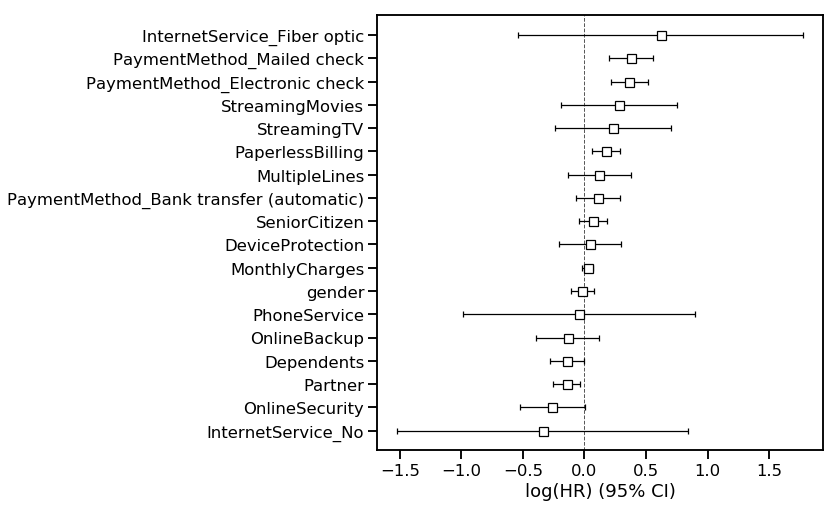

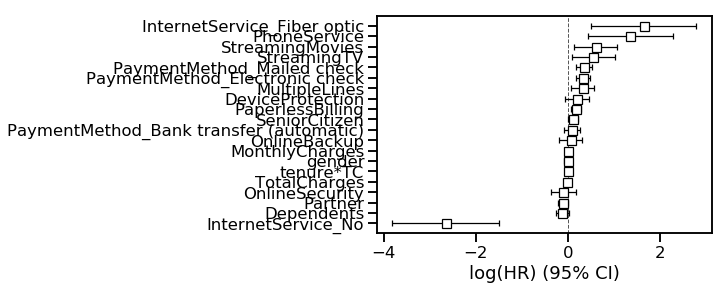

In [17]:
## SOLVE VIOLATED ASSUMPTIONS 


# For dummy variables, stratification is the recommended solution to this issue. 
# I will therefore use it and expose different ways to proceed for the continuous variabels TotalCharges. 

# Start with variable 'Contract_One year'
cph.fit(telcom_cox, duration_col='tenure', event_col='Churn', show_progress = True, strata=['Contract_Two year'])
cph.print_summary()
cph.check_assumptions(telcom_cox)
 
# There still are 5 variables violating the proportional hazards assumptions. 
# namely TotalCharges, InternetService_No, Contract_One year, Partner

cph.fit(telcom_cox, duration_col='tenure', event_col='Churn', show_progress = True, strata=['Contract_Two year', 'Contract_One year', 'TechSupport', 'InternetService_No', 'Partner', 'MultipleLines', 'OnlineSecurity', 'PaymentMethod_Mailed check', 'PaymentMethod_Electronic check' ])
cph.print_summary()
cph.check_assumptions(telcom_cox)

cph.fit(telcom_cox, duration_col='tenure', event_col='Churn', show_progress = True, strata=['Contract_Two year', 'Contract_One year', 'TechSupport', 'InternetService_No'])
cph.print_summary()
cph.check_assumptions(telcom_cox)


"""
# Can first try to stratify the dummy again. 
# For dummy variables, it is adviced to stratify them. For Total Charges, make it time varying is also suggested. 
cph.fit(telcom_cox, duration_col='tenure', event_col='Churn', show_progress = True, strata=['Contract_One year', 'Contract_Two year', 'Partner'])
cph.print_summary()
cph.check_assumptions(telcom_cox)
# Stratify 2 more variables not satisfying the PH assumptions. 
cph.fit(telcom_cox, duration_col='tenure', event_col='Churn', show_progress = True, strata=['Contract_One year', 'Contract_Two year', 'Partner', 'TechSupport', 'InternetService_No'])
cph.print_summary()
cph.check_assumptions(telcom_cox)
# We still have to deal with TotalCharges. So forget this last bit and take care of TotalCharges right after having stratified 'Contract_Two year'
"""

# For TotalCharges, we need to proceed differently as it consists of many values (cts), unlike previous variables. 






# OPTION 1: STRATIFICATION  


# Create bins of length 500. 18 in total. 
telcom_cox_strata_TC = telcom_cox.copy()
telcom_cox_strata_TC['TC_strata'] = pd.cut(telcom_cox_strata_TC['TotalCharges'], np.arange(0, 9001, 500))
telcom_cox_strata_TC[['TotalCharges', 'TC_strata']].head(10)

# drop the orignal, redundant, TotalCharges column
telcom_cox_strata_TC = telcom_cox_strata_TC.drop('TotalCharges', axis=1)

# Check assumption again with new model. 
cph.fit(telcom_cox_strata_TC, duration_col='tenure', event_col='Churn', show_progress = True, strata=[ 'Contract_Two year','TC_strata'] )
cph.check_assumptions(telcom_cox_strata_TC)
# Still Contract_One year and TechSupport violating assumpations. 

# Check assumption again with new model. 
cph.fit(telcom_cox_strata_TC, duration_col='tenure', event_col='Churn', show_progress = True, strata=[ 'Contract_One year','Contract_Two year','TC_strata', 'TechSupport'] )
cph.check_assumptions(telcom_cox_strata_TC)
plt.figure(figsize=(8,8))
ax = plt.subplot()
cph.plot(ax=ax)
cph.print_summary(3)
# They hold now! <we had to stratify the following variables:  'Contract_One year', 'TC_strata', 'Contract_Two year', 'TechSupport'
# Plot of the Cox model effects does not really change; we just lose the effects of the stratified variables: do not appear anymore. 


# Methods of cph
dir(cph)
cph.hazards_
cph.baseline_hazard_  # true coefficients at baseline value of each covariate
cph._log_likelihood   # compute log likelihood 
cph._concordance_score_ # Goodness of fit. Here very good!
cph.predict_expectation(telcom_cox_strata_TC)   # Life expectation of each individual (expected lifetimes)
cph.predict_median(telcom_cox_strata_TC) # Median
cph.predict_cumulative_hazard(telcom_cox_strata_TC)  # get cumulative hazard curve
cph.predict_survival_function(telcom_cox_strata_TC)  # predict survival function for individuals given their covariate. (It is assumed that individual has just entered the study)
cph.predict_percentile(telcom_cox_strata_TC, p=0.80) # return time at which p=0.8 is achieved


# Compute average life expectation for consumers
expectation_data = cph.predict_expectation(telcom_cox_strata_TC)
expectation = 0 
for index, row in expectation_data.iterrows():
    expectation += row
expectation = expectation/ 7032
print(expectation) # It is equal to 47.02


# End of the anlaysis below 


##### OPTION 2: introduce time varying covariates 


# Import required library
from lifelines.utils import to_episodic_format

# Transform to episodic format
# the time_gaps parameter specifies how large or small you want the periods to be.
# Particular dataset created! Many more observations (227990) since we duplicate each instance by considering TotalCharges only on (i,i+1) for i=0 until the individual churns. All variables remain the same.
# Some new columns are created (stop, id) 
telcom_cox_long = to_episodic_format(telcom_cox, duration_col='tenure', event_col='Churn', time_gaps=1.)
telcom_cox_long.head(25)

# Creat time varying variable from TotalCharges
telcom_cox_long['tenure*TC'] = telcom_cox_long['TotalCharges'] * telcom_cox_long['stop']


# Instead of CoxPHFitter, we need CoxTimeVaryingFitter since we are working with an episodic dataset (and time varying covariate)
from lifelines import CoxTimeVaryingFitter
ctv = CoxTimeVaryingFitter()

ctv.fit(telcom_cox_long,
        id_col='id',
        event_col='Churn',
        start_col='start',
        stop_col='stop',
        strata=['Contract_One year', 'Contract_Two year', 'TechSupport'])


# Cox time varying model 
ctv.print_summary(3)
ctv.plot()
dir(ctv)
# Time varying variables TotalCharges, tenure*TC are included! 
# tenure*TC --> coef = 0.00
# TotalCharges --> coef = -0.006
# Results obtained are not as satisfying as stratification so will choose stratification
# This time varying method presents some coding limitations 



# OPTION 3: remove it 

# This option is not viable! 
# For clarity, I deleted the code used, which is essentially using what we have already seen above. 

# If we remove TotalCharges, many more variables do not satisfy the PH assumption, independently of whether we disregard, stratify or delete the 3 other variables not satfisying the assumptions.
# If we remove other variables that originally do not satisfy the PH assumptions, we also get more features not satisfying the PH assumptions.
# Solution could be to include only the variabels that has constant hazard in the previous part but this would imply deleting too many variables


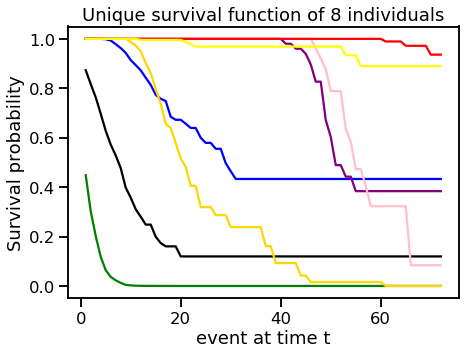

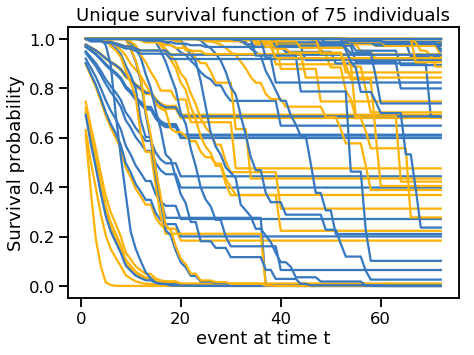

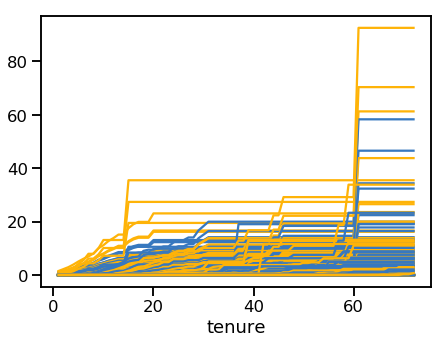

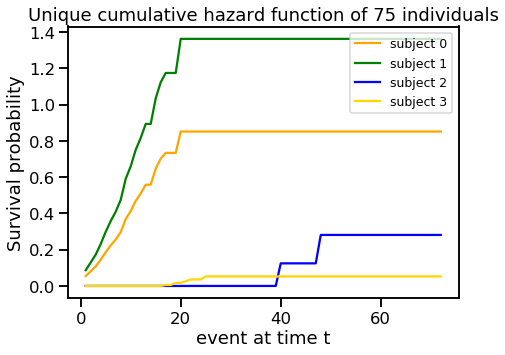

In [19]:
######### BACK TO STRATIFICATION 

# RE-DO COX ANALYSIS WITH NEW MODEL 



# Returns the prediction of the survival function for individuals, given covariates.
telcom_cox_strata_TC_2 = telcom_cox_strata_TC.drop(['Churn', 'tenure'], axis=1)

# Get the unique survival functions of four subjects
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_survival_function(telcom_cox_strata_TC_2.iloc[[10,13,16,20,30,26,31,29,]]).plot(ax=ax, color = ['black', 'green', 'blue', 'gold', 'purple', 'pink', 'red', 'yellow']) 
#plt.legend(['subject 0', 'subject 1', 'subject 2', 'subject 3'], loc='upper right', fontsize='x-small')  ,
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Unique survival function of 8 individuals')
ax.legend().set_visible(False)
plt.show()


# For many subjects 
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_survival_function(telcom_cox_strata_TC_2.iloc[100:175]).plot(ax=ax)
ax.legend().set_visible(False)
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Unique survival function of 75 individuals')

# Prediction of survival proba of every consumer at this particular time. 
cph.predict_survival_function(telcom_cox_strata_TC, times=[1, 10, 25, 50])   # same as telcom_cox_2
# telcom_cox is a dataframe so order of columns does not matter

# Partial hazard
cph.predict_partial_hazard(telcom_cox_strata_TC)

# The cumulative hazard of individuals over the timeline
cph.predict_cumulative_hazard(telcom_cox_strata_TC) # dataframe
# Plot a subset of these cumulative hazards curves. Let's say for 500 individuals. 
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_cumulative_hazard(telcom_cox_strata_TC.iloc[0:500]).plot(ax=ax) 
plt.xlabel('tenure')
ax.legend().set_visible(False)


# Get the unique survival functions of four subjects
plt.figure(figsize=(7,5))
ax = plt.subplot()
cph.predict_cumulative_hazard(telcom_cox_strata_TC_2.iloc[0:4]).plot(ax=ax,color = ['orange', 'green', 'blue', 'gold']) 
plt.legend(['subject 0', 'subject 1', 'subject 2', 'subject 3'], loc='upper right', fontsize='x-small')
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Unique cumulative hazard function of 75 individuals')
plt.show()

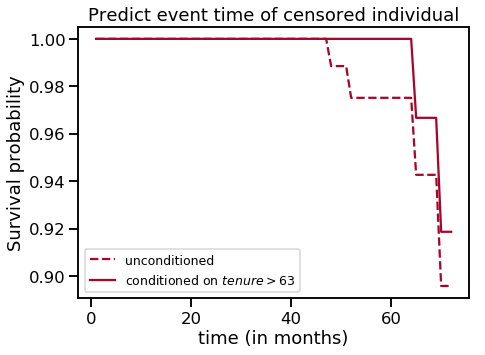

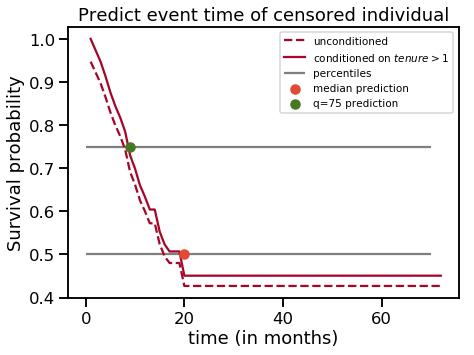

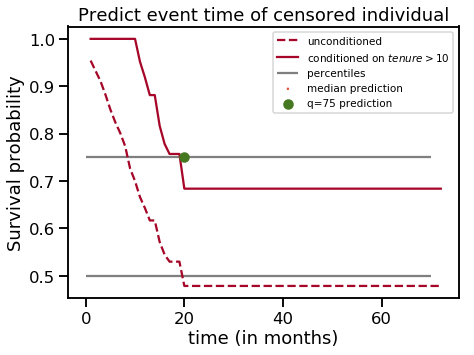

In [34]:
### CENSORED INDIVIDUALS AND CONDITIONAL PROBABILITIES


# Predict event time of censored individuals (only those who did not churn during the study time)
censored_subjects = telcom_cox_strata_TC.loc[telcom_cox_strata_TC['Churn'] == 0]
unconditioned_sf = cph.predict_survival_function(censored_subjects)
unconditioned_sf = unconditioned_sf.sort_index(axis =1)
conditioned_sf = unconditioned_sf.apply(lambda c: (c / c.loc[telcom_cox_strata_TC.loc[c.name, 'tenure']]).clip_upper(1))
# let's focus on a single subject
subject = 29 # Not the 29th individual but 29th column of the censored dataset. 
censored_subjects.iloc[subject,:] # tenure = 63, has not churned yet
plt.figure(figsize=(7,5))
ax = plt.subplot()
unconditioned_sf.iloc[:,subject].plot(ls="--", color="#A60628", label="unconditioned", ax=ax)
conditioned_sf.iloc[:,subject].plot(color="#A60628", label="conditioned on $tenure>63$")
plt.ylabel('Survival probability')
plt.xlabel('time (in months)')
plt.title('Predict event time of censored individual')
plt.legend(fontsize='x-small', loc = 'bottow right') 


# From here, you can pick a median or percentile as a best guess as to the subject’s event time:
from lifelines.utils import median_survival_times, qth_survival_times
predictions_50 = median_survival_times(conditioned_sf)
predictions_75 = qth_survival_times(0.75, conditioned_sf)

# plotting subject 30 again
# Can pick a median or a percentile as best guess for churn's time occurence
subject = 0
censored_subjects.iloc[subject,:]
plt.figure(figsize=(7,5))
ax = plt.subplot()
unconditioned_sf.iloc[:,subject].plot(ls="--", color="#A60628", label="unconditioned", ax=ax)
conditioned_sf.iloc[:,subject].plot(color="#A60628", label="conditioned on $tenure>1$",ax=ax)
plt.hlines([0.5, 0.75], 0, 70, alpha=0.5, label="percentiles")
plt.scatter(median_survival_times(conditioned_sf.iloc[:,subject]), 0.5,  color="#E24A33", label="median prediction", zorder=20)
plt.scatter(qth_survival_times(0.75, conditioned_sf.iloc[:,subject]), 0.75,  color="#467821", label="q=75 prediction", zorder=20)
plt.ylabel('Survival probability')
plt.xlabel('time (in months)')
plt.title('Predict event time of censored individual')
plt.legend(fontsize='xx-small', loc = 'bottom left')

# careful it can be infinite sometimes...  Like for 12th or 15th individual of the (un)conditioned_sf dataframe. 


# Other example
# let's focus on a single subject
subject = 4
censored_subjects.iloc[subject,:]
plt.figure(figsize=(7,5))
ax = plt.subplot()
unconditioned_sf.iloc[:,subject].plot(ls="--", color="#A60628", label="unconditioned", ax=ax)
conditioned_sf.iloc[:,subject].plot(color="#A60628", label="conditioned on $tenure>10$",ax=ax)
plt.hlines([0.5, 0.75], 0, 70, alpha=0.5, label="percentiles")
plt.scatter(median_survival_times(conditioned_sf.iloc[:,subject]), 0.5,  color="#E24A33", label="median prediction", zorder=20)
plt.scatter(qth_survival_times(0.75, conditioned_sf.iloc[:,subject]), 0.75,  color="#467821", label="q=75 prediction", zorder=20)
plt.ylabel('Survival probability')
plt.xlabel('time (in months)')
plt.title('Predict event time of censored individual')
plt.legend(fontsize='xx-small', loc = 'bottom left')


<Figure size 504x360 with 0 Axes>

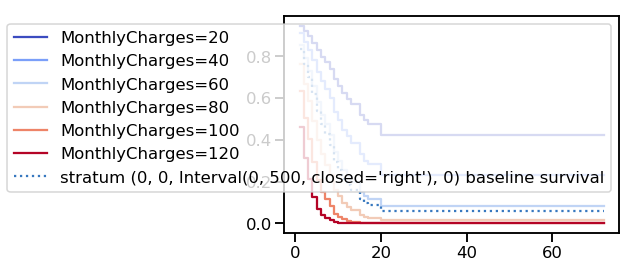

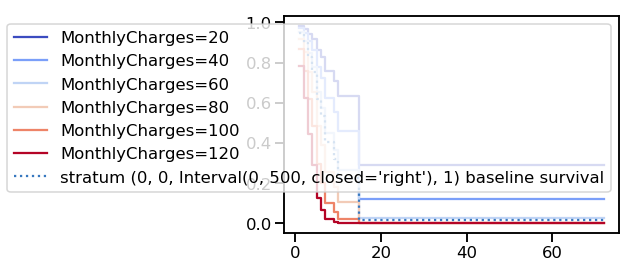

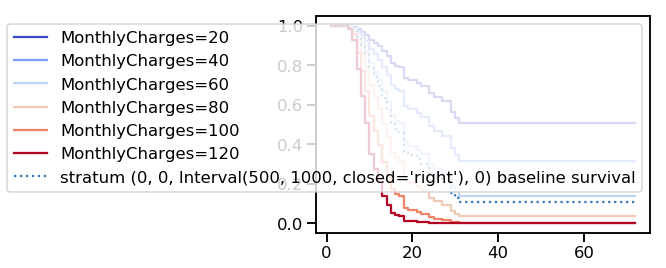

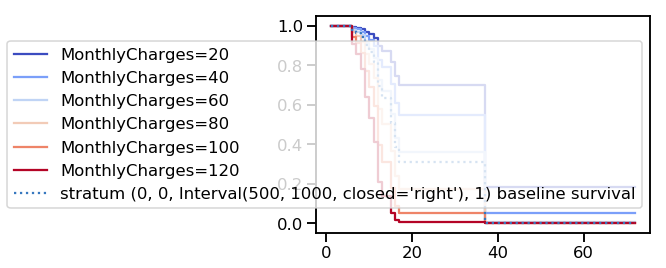

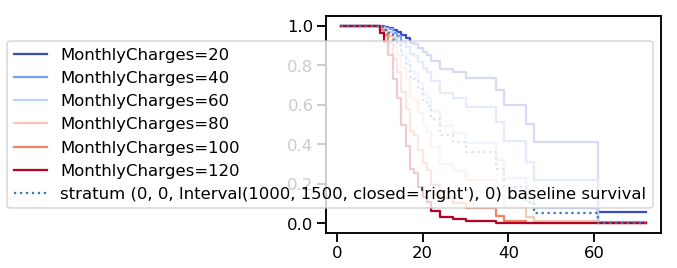

...

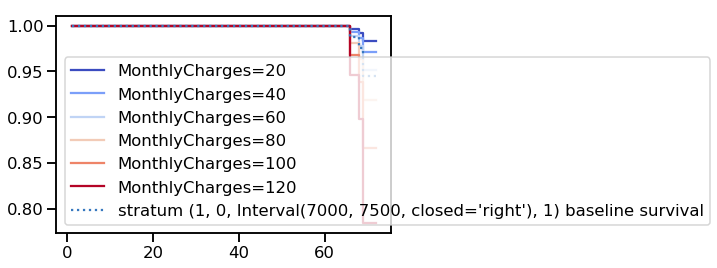

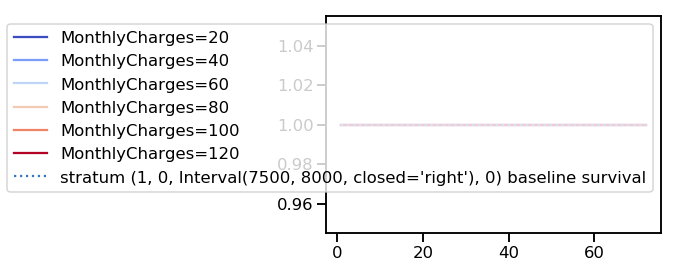

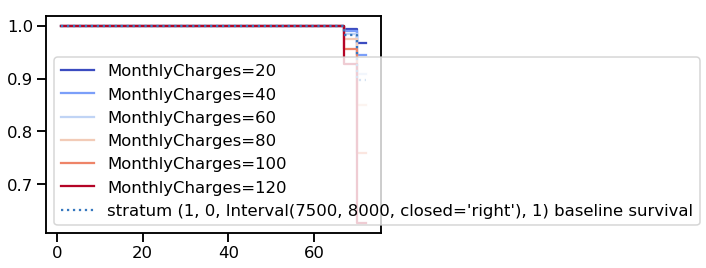

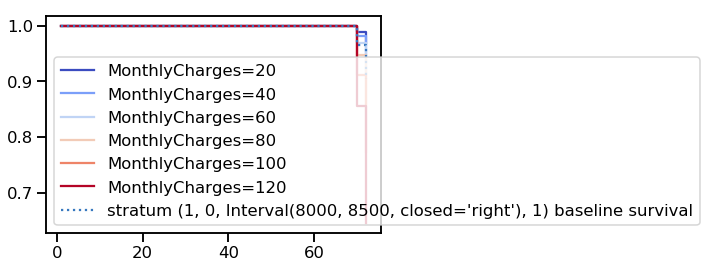

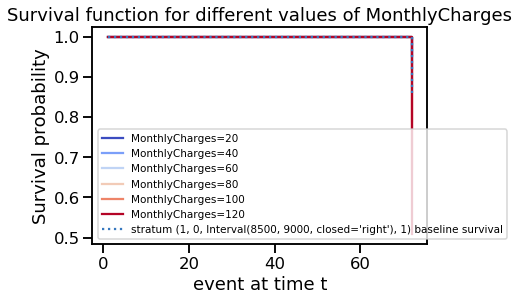

<Figure size 504x360 with 0 Axes>

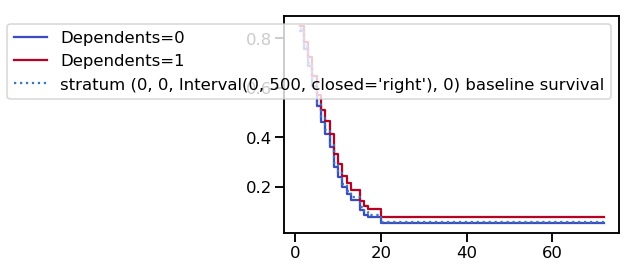

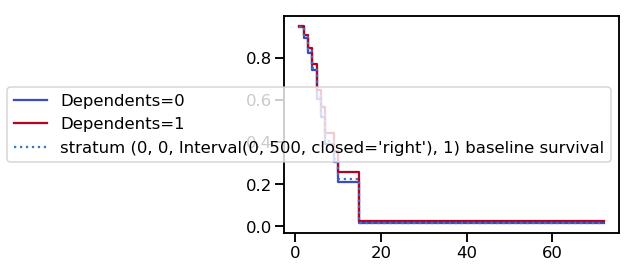

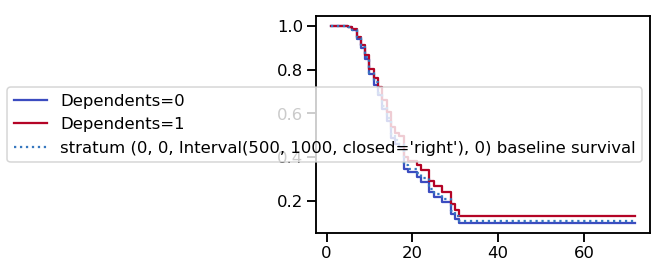

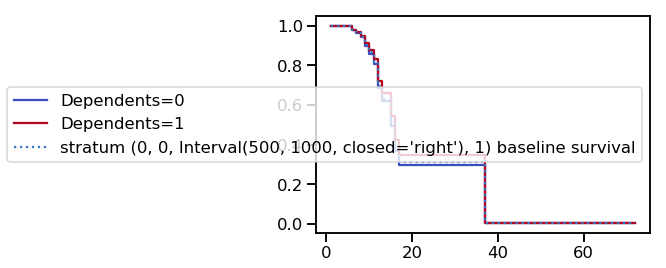

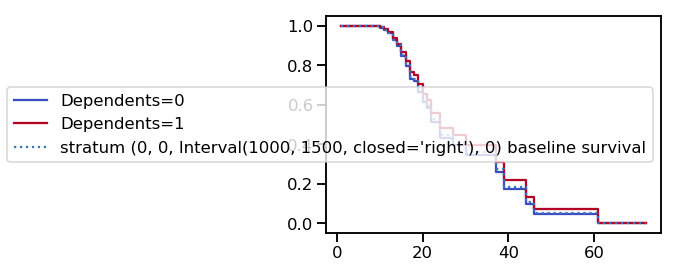

...

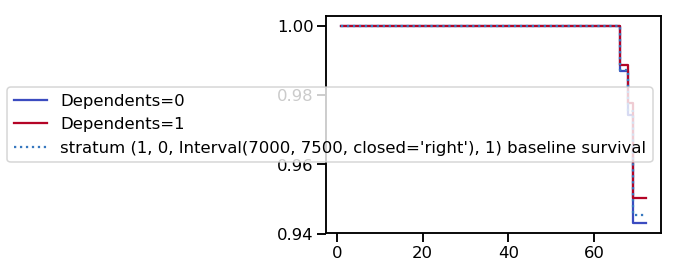

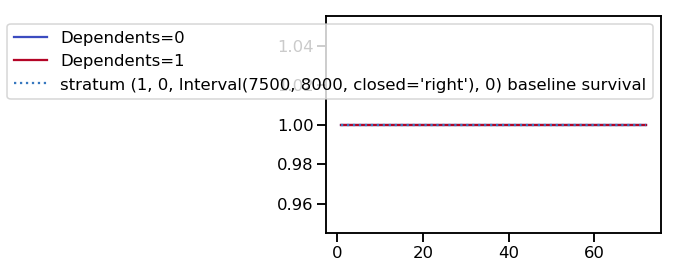

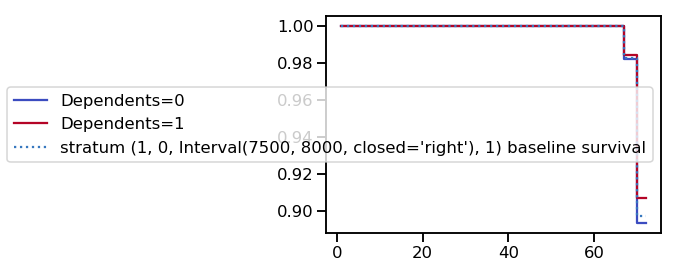

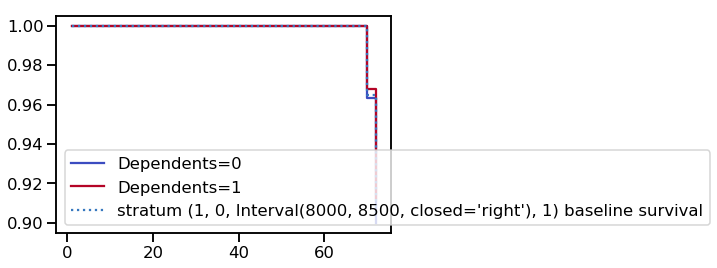

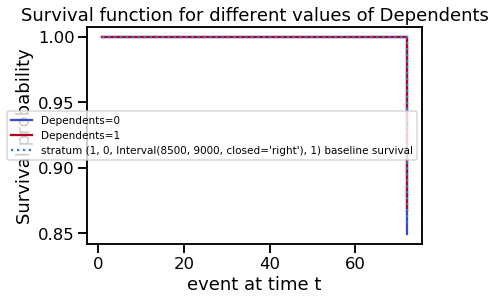

In [32]:
### COVARIATE SEGMENTATION ! 
# Plot what the survival curves look like as we vary a single covariate while holding everything else equal. 
# This is useful to understand the impact of a covariate, given the model
plt.figure(figsize=(7,5))
cph.plot_covariate_groups('MonthlyCharges', [20, 40, 60, 80, 100, 120], cmap='coolwarm')
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Survival function for different values of MonthlyCharges')
plt.legend(fontsize='xx-small')

# Another, dummy variable this time
plt.figure(figsize=(7,5))
cph.plot_covariate_groups('Dependents', [0,1], cmap='coolwarm')
plt.ylabel('Survival probability')
plt.xlabel('event at time t')
plt.title('Survival function for different values of Dependents')
plt.legend(fontsize='xx-small')

martingale   -7.973018e-18
Name: 0, dtype: float64


,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,StreamingTV,StreamingMovies,PaperlessBilling,MonthlyCharges,InternetService_Fiber optic,InternetService_No,PaymentMethod_Bank transfer (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,tenure,Churn
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1,0
20,1.628818e-01,-6.207154e-02,-9.240119e-02,4.138050e-02,2.191549e+01,5.484521e+00,5.427900e+00,5.503935e+00,5.440730e+00,1.098279e+01,1.090311e+01,-8.231223e-02,-1.093912e+00,2.730824e+01,-2.741392e+01,3.085421e-02,2.757771e-02,2.978635e-02,1,1
22,2.097475e-01,-8.104890e-02,-1.186729e-01,5.251347e-02,2.822558e+01,7.063681e+00,6.990766e+00,7.089223e+00,7.005856e+00,1.414581e+01,1.404096e+01,-1.074448e-01,-1.408818e+00,3.517146e+01,-3.529947e+01,3.931466e-02,3.463598e-02,3.935196e-02,1,1
27,1.856577e-01,-7.176176e-02,-1.042325e-01,4.814611e-02,2.498130e+01,6.252081e+00,6.187073e+00,6.275659e+00,6.200553e+00,1.252013e+01,1.242735e+01,-9.549724e-02,-1.246962e+00,3.112984e+01,-3.124987e+01,3.496551e-02,3.134167e-02,3.377763e-02,1,1
33,-7.035627e-32,2.717939e-32,3.983626e-32,-1.763867e-32,-9.467882e-30,-2.369378e-30,-2.344944e-30,-2.377963e-30,-2.349989e-30,-4.744990e-30,-4.709799e-30,3.605856e-32,4.725667e-31,-1.179767e-29,1.184057e-29,-1.374452e-32,-1.159024e-32,-1.262487e-32,1,0


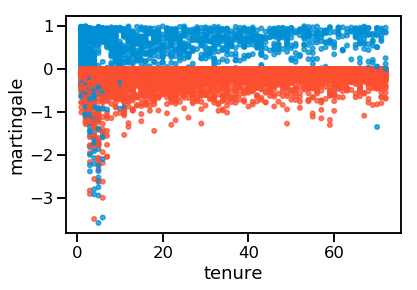

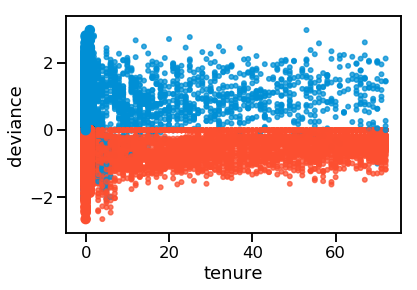

In [35]:
########### CHECK OTHER ASSUMPTIONS COX MODEL


# Linearity of relationship between covariates and log hazard 
# Survival function takes the exponential form 


# Martingales residuals 
r = cph.compute_residuals(telcom_cox_strata_TC, 'martingale')
r.head()

# Plot against tenure
r.plot.scatter(
    x='tenure', y='martingale', c=np.where(r['Churn'], '#008fd5', '#fc4f30'),
    alpha=0.75
)

# Expectation of martingales 
martingales_data = r['martingale']
martingales_data = martingales_data.to_frame()
expect = 0 
for index, row in martingales_data.iterrows():
    expect += row
expect = expect/ 7032
print(expect) # It is equal to -7.973018e-18


# Deviance residuals 
r = cph.compute_residuals(telcom_cox_strata_TC, 'deviance')
r.head()

# Similar plot to above
r.plot.scatter(
    x='tenure', y='deviance', c=np.where(r['Churn'], '#008fd5', '#fc4f30'),
    alpha=0.75
)

# Study a covariate
r = r.join(telcom_cox_strata_TC.drop(['tenure', 'Churn'], axis=1))
plt.scatter(r['Dependents'], r['deviance'], color=np.where(r['Churn'], '#008fd5', '#fc4f30'))

r = cph.compute_residuals(telcom_cox_strata_TC, 'delta_beta')
r.head()
r = r.join(telcom_cox_strata_TC[['tenure', 'Churn']])
r.head()

# Can be used to spot outliers. 